In [1]:
import numpy as np
import itertools
import warnings
import math
import cv2
import os
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
%matplotlib inline

# 1. Image Mosaicing

## 1.1 Feature Detection and Matching
**Using ORB features to find matches between two partially overlapping images**

In [2]:
def ORB_feature_matching(images,num_matches):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    orb = cv2.ORB_create()
    list1 = []
    list2 = []
    for img in images:
        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        kp, des = orb.detectAndCompute(img_gray,None)
        list1.append(kp)
        list2.append(des)

    matches = sorted(bf.match(list2[0],list2[1]), key = lambda x:x.distance)  
    draw_params = dict(matchColor=(0, 255, 0),
                       singlePointColor=None,
                       matchesMask=None,                       
                       flags=2)
    im = cv2.drawMatches(images[0],list1[0],images[1],list1[1],matches[:num_matches],None, **draw_params)
    return matches,list1,list2,im

## 1.2 Estimating Homography Matrix using Ransac

In [3]:
def homography_matrix(pair_list):
    A = []
    for pair in pair_list:
        A.append([-pair[0][0],-pair[0][1],-1,0,0,0,pair[1][0]*pair[0][0],pair[1][0]*pair[0][1],pair[1][0]])
        A.append([0,0,0,-pair[0][0],-pair[0][1],-1,pair[1][1]*pair[0][0],pair[1][1]*pair[0][1],pair[1][1]])
    A = np.array(A)
    u, s, v = np.linalg.svd(A)
    H = v[-1,:] / v[-1,-1]
    H = H.reshape((3,3))
    return H

## 1.3 Calculating Transformation Matrix

In [4]:
def Match_Features(matched_features, list1):
    inliers = 0
    H = np.zeros((3,3))

    n = 30
    if len(matched_features) < n:
        return None
    p = np.float32([list1[0][match.queryIdx].pt for match in matched_features[0:n]]).reshape(-1,1,2)
    q = np.float32([list1[1][match.trainIdx].pt for match in matched_features[0:n]]).reshape(-1,1,2)

    for i in range(300):
        curr_inliers = 0
        err = 0
        sampling = np.random.choice(len(p),4) 
        pairs = []
        for sample in sampling:
            pairs.append((p[sample,0,:], q[sample,0,:] ))
        curr_H = homography_matrix(pairs)
        for j in range(len(p)):
            p1 = np.array([p[j,0,:][0],p[j,0,:][1],1]).T
            p2 = np.array([q[j,0,:][0],q[j,0,:][1],1]).T
            proj_p1 = np.dot(curr_H,p1)
            proj_p1 = proj_p1/proj_p1[2]
            err = np.linalg.norm(p2-proj_p1)
            if(err<10):
                curr_inliers+=1
        if curr_inliers>inliers:
            inliers = curr_inliers
            H = curr_H
            
    return H,inliers

## 1.4 Image Stitching

In [5]:
def image_stitching(H,images):
    h,w,c = images[0].shape
    h1,w1,c1 = images[1].shape
    stitched = cv2.warpPerspective(images[1],np.linalg.inv(H),tuple([w+w1,h+h1]))
    stitched[0 : h , 0: w,:] = images[0]
    temp = np.sum(stitched, axis=2)
    stitched = stitched[~np.all(temp == 0, axis=1)]
    stitched = stitched[:,~np.all(temp == 0, axis=0)]
    return stitched

In [6]:
def transformation_matrix(images):
    matches,list1,list2,im =  ORB_feature_matching(images,30)
    fig = plt.figure(figsize=(10,10))
    plt.axis('off')
    plt.imshow(im)  
    plt.show()
    H,_ = Match_Features(matches,list1)
    final_image = image_stitching(H,images)
    return final_image

## 1.5 Panorama from Multiple Images

### Loading Images 

In [7]:
img_list1 = []
for i in range(4):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/1_"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB) 
    img_list1.append(im)

img_list2 = []
for i in range(6):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/2_"+str(i+1)+".png"),cv2.COLOR_BGR2RGB) 
    img_list2.append(im)

img_list3 = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/3_"+str(i+1)+".png"),cv2.COLOR_BGR2RGB)   
    img_list3.append(im)

img_list4 = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/4_"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB) 
    img_list4.append(im)

img_list5 = []
for i in range(4):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/5_"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB)    
    img_list5.append(im)

### Scene 1

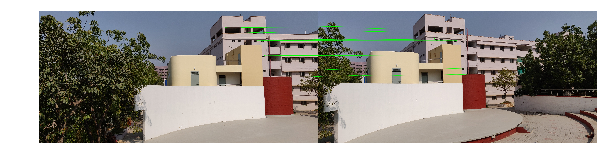

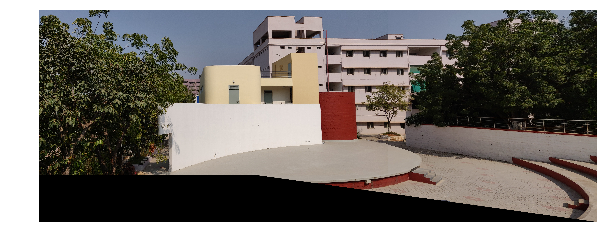

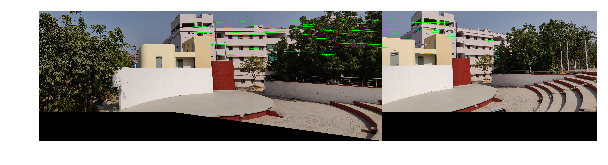

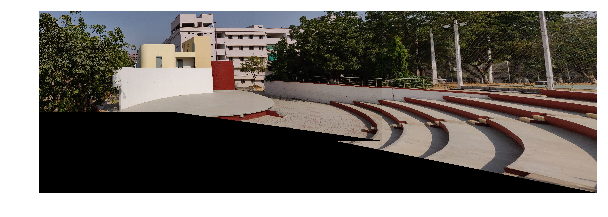

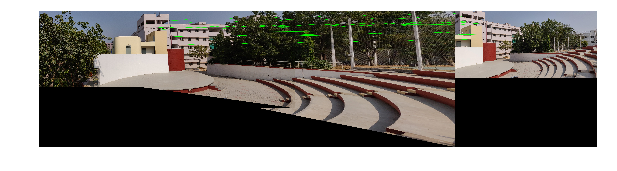

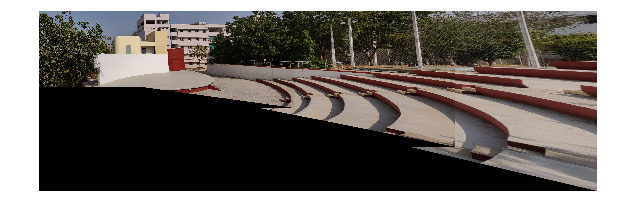

In [11]:
final_img = transformation_matrix(img_list1[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img)
plt.axis('off')
plt.show()

final_img = transformation_matrix([final_img,img_list1[2]])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img)
plt.axis('off')
plt.show()

final_img = transformation_matrix([final_img,img_list1[3]])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img)
plt.axis('off')
plt.show()

### Scene 2

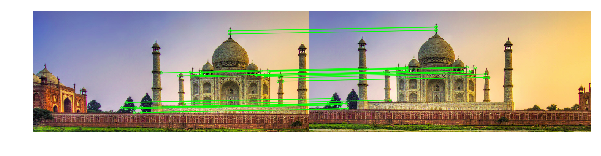

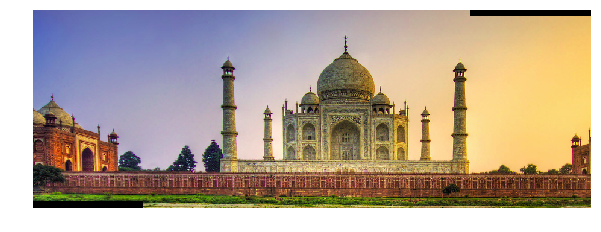

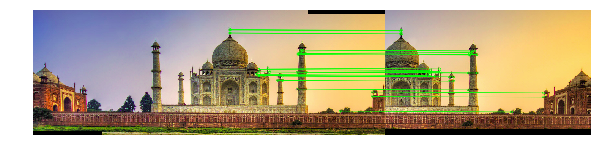

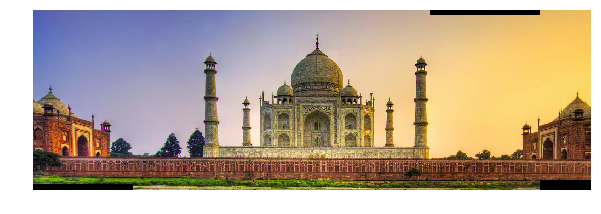

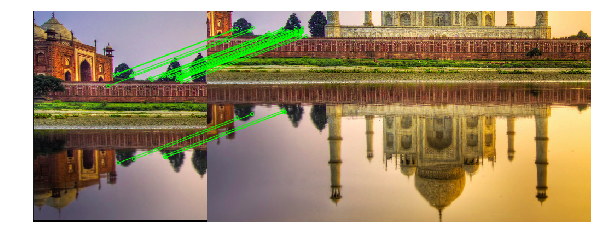

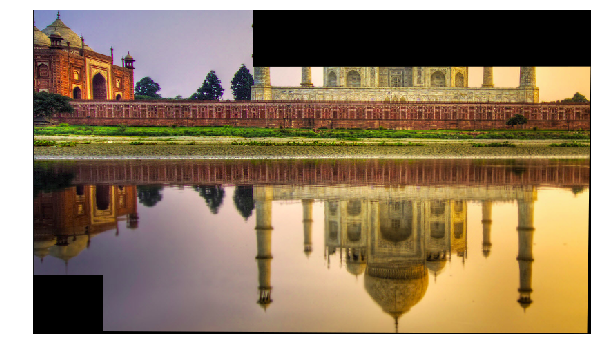

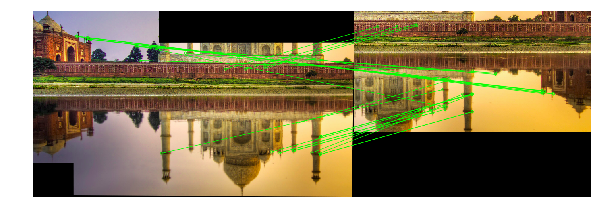

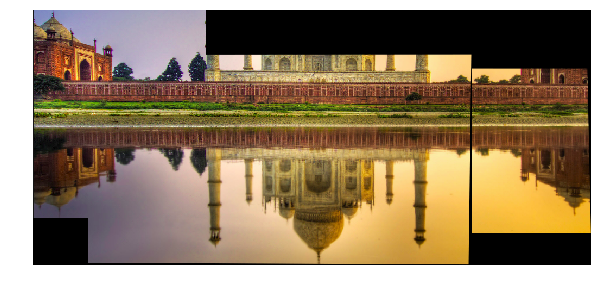

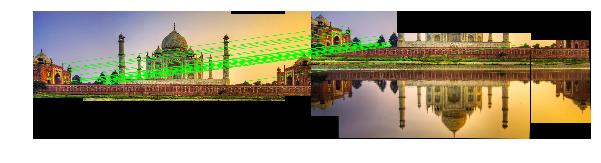

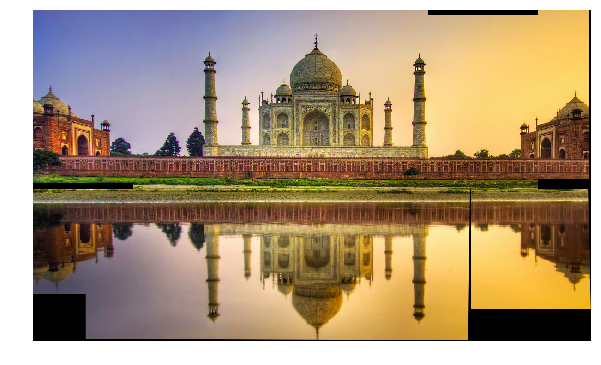

In [12]:
final_img1 = transformation_matrix(img_list2[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

final_img1 = transformation_matrix([final_img1,img_list2[2]])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

final_img2 = transformation_matrix(img_list2[3:5])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img2)
plt.axis('off')
plt.show()

final_img2 = transformation_matrix([final_img2,img_list2[5]])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img2)
plt.axis('off')
plt.show()

final_img = transformation_matrix([final_img1,final_img2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img)
plt.axis('off')
plt.show()

### Scene 3

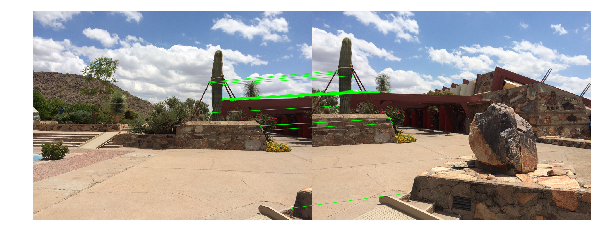

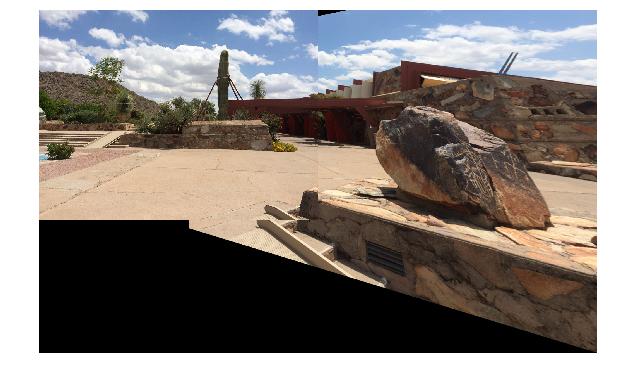

In [14]:
final_img1 = transformation_matrix(img_list3[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

### Scene 4

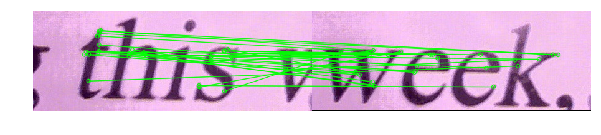

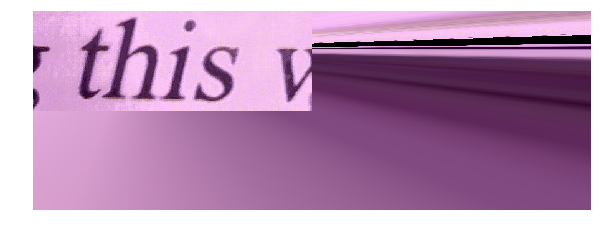

In [16]:
final_img1 = transformation_matrix(img_list4[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

### Scene 5

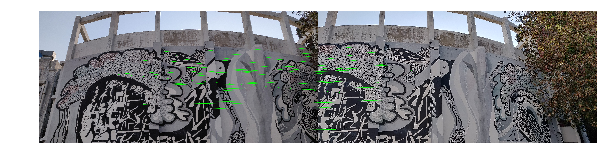

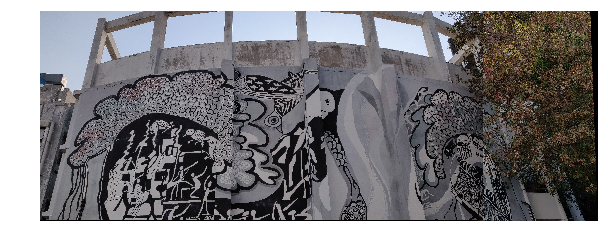

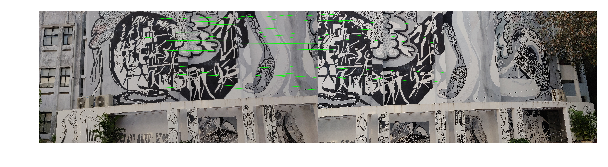

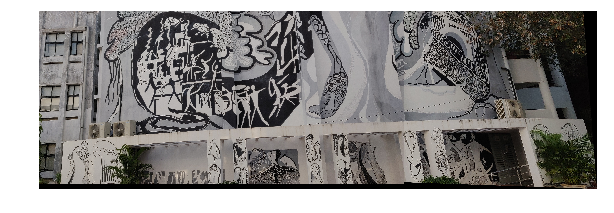

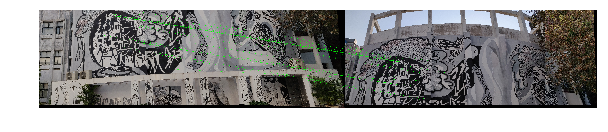

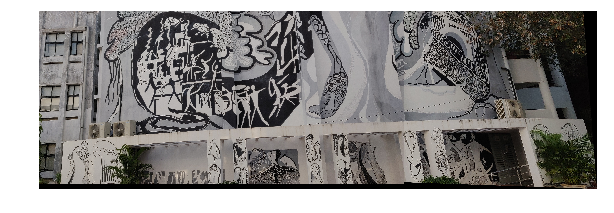

In [17]:
final_img1 = transformation_matrix(img_list5[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

final_img2 = transformation_matrix([img_list5[3],img_list5[2]])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img2)
plt.axis('off')
plt.show()

final_img = transformation_matrix([final_img2,final_img1])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img)
plt.axis('off')
plt.show()

### 1.7 Captured Scene

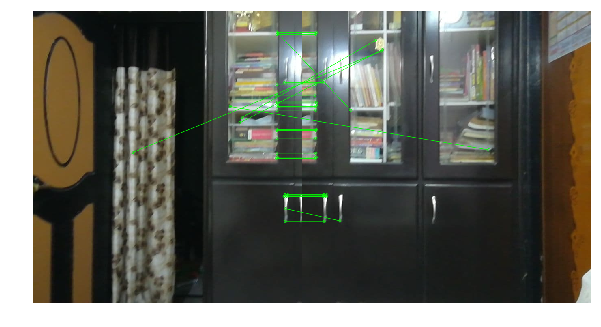

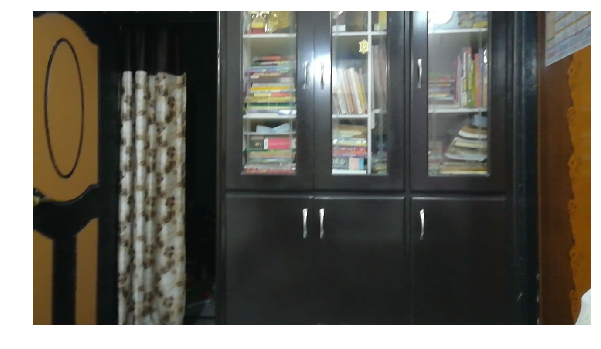

In [18]:
img_list = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Image Mosaicing/a"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB) 
    img_list.append(im)

final_img1 = transformation_matrix(img_list[:2])
fig = plt.figure(figsize=(10,10))
plt.imshow(final_img1)
plt.axis('off')
plt.show()

# 2. Stereo Correspondences

### Loading Images

In [19]:
im_list1 = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Stereo Correspondence/1_"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB) 
    im_list1.append(im)

im_list2 = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Stereo Correspondence/2_"+str(i+1)+".png"),cv2.COLOR_BGR2RGB) 
    im_list2.append(im)

im_list3 = []
for i in range(2):
    im = cv2.cvtColor(cv2.imread("../images/Stereo Correspondence/3_"+str(i+1)+".jpg"),cv2.COLOR_BGR2RGB)   
    im_list3.append(im)

## 2.1 Intensity window-based correlation

In [20]:
def intensity_match(img,window_size=128,stride=128,thresh=0):
    matches = []
    for i in range(0,img[0].shape[0]-window_size+1,stride):
        for j in range(0,img[0].shape[1]-window_size+1,stride):
            diff = -1
            for k in range(0,img[1].shape[0]-window_size+1,stride):
                for l in range(0,img[1].shape[1]-window_size+1,stride):
                    a = img[0][i:i+window_size,j:j+window_size,:].flatten()
                    b = img[1][k:k+window_size,l:l+window_size,:].flatten()
                    curr_diff = abs(np.dot((a-np.mean(a))/(np.linalg.norm(a-np.mean(a))+1),(b-np.mean(b))/(np.linalg.norm(b-np.mean(b))+1)))
                    if curr_diff>diff:
                        diff = curr_diff
                        patch = np.array([[i+thresh,j],[k+thresh,l],curr_diff])
            matches.append(patch)
    return matches

def draw(img,matches,window_size=0):
    r,c,_ = img[0].shape
    img3 = np.zeros((r,2*c,3))
    img3[:,:c,:] = img[0]
    img3[:,c:,:] = img[1]
    
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())
        p = (match[0][1]+window_size//2,match[0][0]+window_size//2)
        q = (match[1][1]+c+window_size//2,match[1][0]+window_size//2)
        img = cv2.line(img3,p,q,color,2)
        img1 = cv2.circle(img,p,5,color,-1)
        img2 = cv2.circle(img,q,5,color,-1)
    return img

### Scene 1

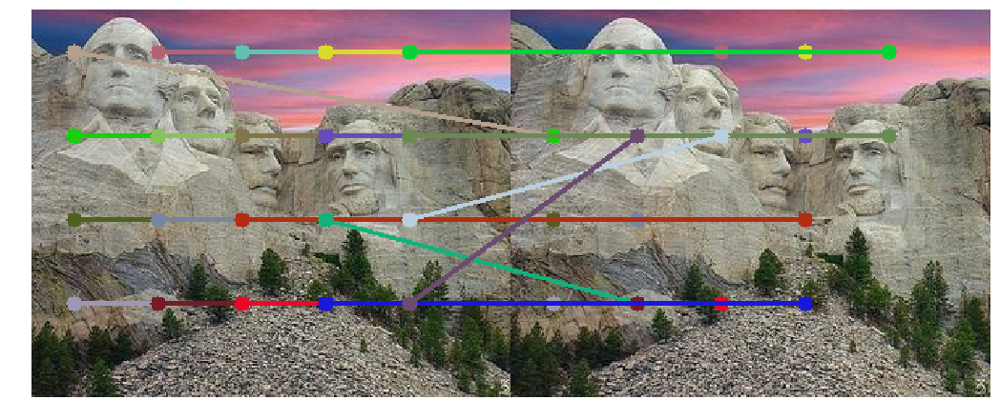

In [21]:
matches = intensity_match(im_list1,56,56)
out = draw(im_list1,matches,56)
plt.figure(figsize=(18,18))
plt.imshow(out.astype(np.uint8))
plt.axis('off')
plt.show()

### Scene 2

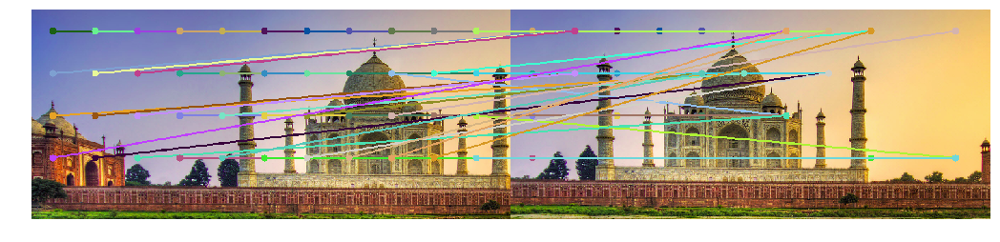

In [22]:
img3 = np.zeros((317,725,3))
for i in range(317):
    for j in range(725):
        for l in range(3):
            img3[i,j,l] = im_list2[1][i,j,l]

matches = intensity_match([im_list2[0],img3],64,64)
out = draw([im_list2[0],img3],matches,64)
plt.figure(figsize=(18,18))
plt.imshow(out.astype(np.uint8))
plt.axis('off')
plt.show()

### Scene 3

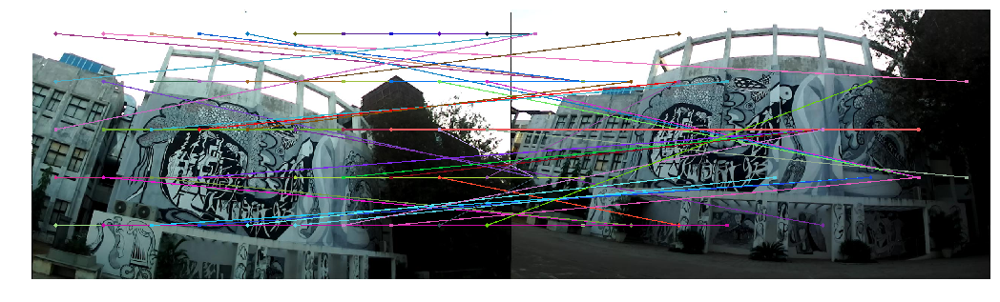

In [23]:
matches = intensity_match(im_list3,128,128)
out = draw(im_list3,matches,128)
plt.figure(figsize=(18,18))
plt.imshow(out.astype(np.uint8))
plt.axis('off')
plt.show()

## 2.2 Epipolar Lines

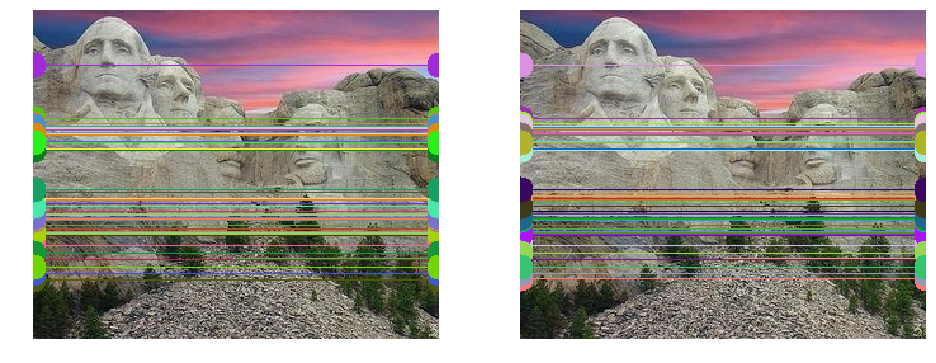

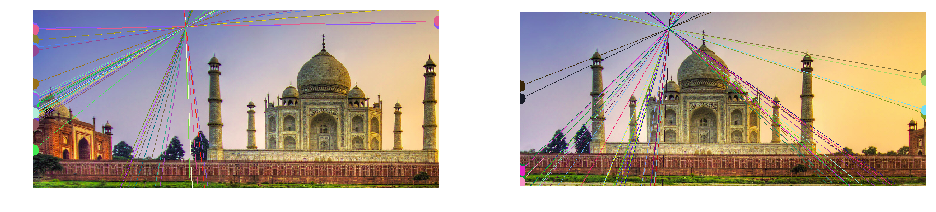

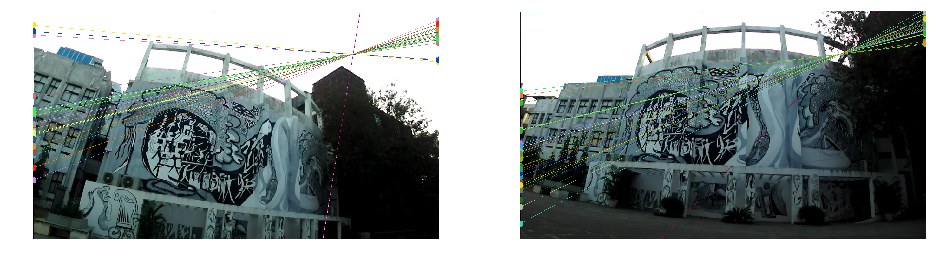

In [24]:
def drawlines(img,lines,pts1,pts2):
    r,c,_ = img[0].shape
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img[0], (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,(x0,y0),10,color,-1)
        img1 = cv2.circle(img1,(x1,y1),10,color,-1)

    return img1

def epipolar_lines(img,k=50):
    matches,kp_list,des_list,_ =  ORB_feature_matching(img,k)
    best_matches = matches[0:k]
    src_pts = np.float32([ kp_list[0][m.queryIdx].pt for m in best_matches ])
    dst_pts = np.float32([ kp_list[1][m.trainIdx].pt for m in best_matches ])
    F, mask = cv2.findFundamentalMat(src_pts,dst_pts,cv2.RANSAC)
    pts1 = src_pts[mask.ravel()==1]
    pts2 = dst_pts[mask.ravel()==1]
    
    new_column=np.array([[1] for i in range(len(pts2))])
    pts2 = np.append(pts2, new_column, axis=1)
    lines1=(np.matmul(F,pts2.T)).T
    lines1 = lines1.reshape(-1,3)
    img1 = drawlines(img,lines1,pts1,pts2)

    new_column=np.array([[1] for i in range(len(pts1))])
    pts1 = np.append(pts1, new_column, axis=1)
    lines2=(np.matmul(F,pts1.T)).T
    lines2 = lines2.reshape(-1,3)
    img2 = drawlines([img[1],img[0]],lines2,pts2,pts1)
    
    fig = plt.figure(figsize=(16,16))
    plt.subplot(1, 2, 1),plt.imshow(img1)
    plt.axis('off')
    plt.subplot(1, 2, 2),plt.imshow(img2)
    plt.axis('off')
    plt.show()
    
epipolar_lines(im_list1,50)
epipolar_lines(im_list2,50)
epipolar_lines(im_list3,50)

## 2.3 Image Rectification

In [25]:
def stereo_rectification(img,k):
    matches,kp_list,des_list,_ =  ORB_feature_matching(img,k)
    best_matches = matches[0:k]
    src_pts = np.float32([ kp_list[0][m.queryIdx].pt for m in best_matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_list[1][m.trainIdx].pt for m in best_matches ]).reshape(-1,1,2)
    F, mask = cv2.findFundamentalMat(src_pts,dst_pts,cv2.RANSAC)
    src_pts = src_pts[mask.ravel()==1]
    dst_pts = dst_pts[mask.ravel()==1]
    img_size = img[0].shape[0:2][::-1]
    p,H1,H2=cv2.stereoRectifyUncalibrated(src_pts,dst_pts, F, img_size)
    img1_corrected = cv2.warpPerspective(img[0], H1, img_size)
    img2_corrected = cv2.warpPerspective(img[1], H2, img_size)
    return img1_corrected, img2_corrected

def greedy_matching(img,window_size,stride):
    matches = []
    for y in range(0,img[0].shape[0]-window_size,stride):
        im1 = img[0][y:y+window_size+1,:,:]    
        im2 = img[1][y:y+window_size+1,:,:]    
        new_matches = intensity_match([im1,im2],window_size,stride,y)
        matches = matches + new_matches
    return matches

## Greedy matching

In [26]:
def corr2d(img1, img2):
    if(img1.shape[1] > img2.shape[1]):
        img1 = img1[:,:img2.shape[1]]
    elif(img1.shape[1] < img2.shape[1]):
        img2 = img2[:,:img1.shape[1]]
        
    img1 = img1 - (sum(img1)/(img1.shape[0]*img1.shape[1]))
    img2 = img2 - (sum(img2)/(img2.shape[0]*img2.shape[1]))
    img1Sq = (img1*img1).sum()
    img2Sq = (img2*img2).sum()
    return (img1*img2).sum() / math.sqrt(img1Sq * img2Sq)

def greedy_matching(images, window_size=128):
    h,w,d = images[0].shape
    h1,w1,d1 = images[1].shape
    finalImage = np.concatenate((images[0], images[1]),axis=1)
    for i in range(0, h, window_size):
        for j in range(0, w, window_size):
            sample1 = images[0][i:i+window_size, j:j+window_size]
            sampleCenter1 = (j+window_size//2, i+window_size//2)
            leastDis = -0.00001
            bestDis = 0
            for k in range(0,w1,window_size):
                sample2 = images[1][i:i+window_size, k:k+window_size]
                dis = corr2d(sample1, sample2)
                if(dis > leastDis):
                    bestDis = k
                    leastDis = dis
            sampleCenter2 = (bestDis + window_size//2 +w, i+window_size//2)
            cv2.line(finalImage, 
                    sampleCenter1, 
                    sampleCenter2,
                    (125,0,125),
                    5
                   )
            
    plt.imshow(finalImage)
    plt.show()

### Scene 1

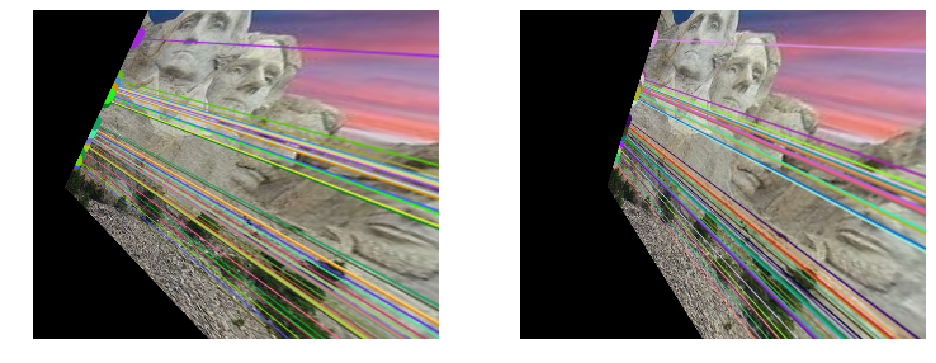

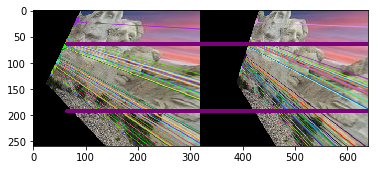

In [27]:
img1 = stereo_rectification(im_list1,50)
fig = plt.figure(figsize=(16,16))
plt.subplot(1, 2, 1),plt.imshow(img1[0])
plt.axis('off')
plt.subplot(1, 2, 2),plt.imshow(img1[1])
plt.axis('off')
plt.show()

matches = greedy_matching(img1,128)

### Scene 2

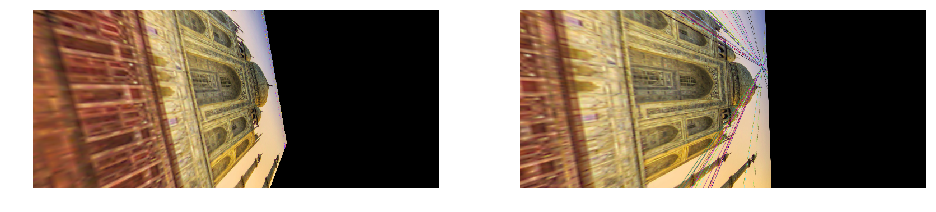

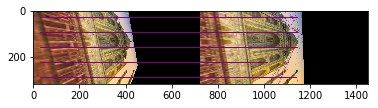

In [28]:
img2 = stereo_rectification(im_list2,15)
fig = plt.figure(figsize=(16,16))
plt.subplot(1, 2, 1),plt.imshow(img2[0])
plt.axis('off')
plt.subplot(1, 2, 2),plt.imshow(img2[1])
plt.axis('off')
plt.show()
matches = greedy_matching(img2,64)

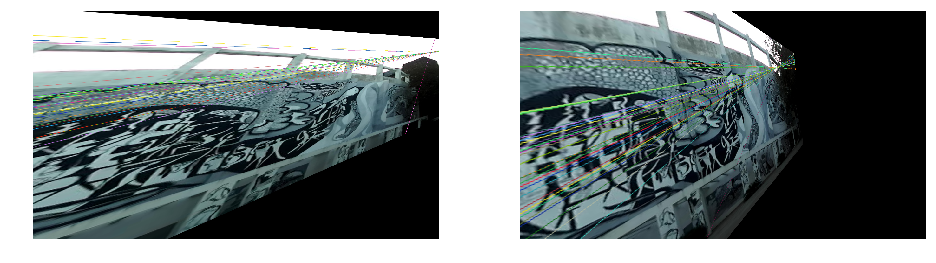

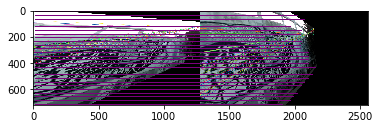

In [29]:
img3 = stereo_rectification(im_list3,10)
fig = plt.figure(figsize=(16,16))
plt.subplot(1, 2, 1),plt.imshow(img3[0])
plt.axis('off')
plt.subplot(1, 2, 2),plt.imshow(img3[1])
plt.axis('off')
plt.show()
matches = greedy_matching(img3,28)

## 2.4 Greedy Vs Intensity Matching (Brute Force)

### Intensity window matching

1. we start with a patch in one image and correlate it with all possible patches in other.
2. we pick the pair of patches with maximum correlation.
3. In this technique, time complexity is quadratic in terms of the no.of patches.

### Greedy matching
1. we compute epipolar lines and get the corresponding point of one image on the other.
2. Computing epipolar lines/points is in linear time complexity.

## 2.5 Bonus

In [30]:
def dense_sift_matching(images,minMatch = 100):
    h,w,c = images[0].shape
    keyPoint=[]
    for i in range(1,h,10):
        for j in range(1,w,10):
            keyPoint.append(cv2.KeyPoint(i, j, 3))
    
    sift = cv2.xfeatures2d.SIFT_create()
    gray_image1 = cv2.cvtColor(images[0],cv2.COLOR_RGB2GRAY)
    gray_image2 = cv2.cvtColor(images[0],cv2.COLOR_RGB2GRAY)
    keyPoint1,descriptor1 = sift.compute(gray_image1,keyPoint)
    keyPoint2,descriptor2 = sift.compute(gray_image2,keyPoint)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptor1,descriptor2, k =2)
    shortlistedPoints = []
    for m, n in matches:
        if m.distance < 0.5 * n.distance:
            shortlistedPoints.append([m])
    image3 = cv2.drawMatchesKnn(image1, keyPoint1, image2, keyPoint2, shortlistedPoints, None, flags=2)
    return image3

In [34]:
image = dense_sift_matching(im_list1)
plt.imshow(image)
plt.show()

image = dense_sift_matching(im_list2)
plt.imshow(image)
plt.show()

image = dense_sift_matching(im_list3)
plt.imshow(image)
plt.show()

- SIFT image correspondences are far better than the Intensity based matches